<a href="https://colab.research.google.com/github/shariq101/Neural-Network-Disected-and-Analysed/blob/main/Neural_Network_Disected_and_Explained.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import expit
from tqdm import tnrange

def get_XY(dataset):
    '''
    This function divides a dataset in features and labels and 
    returns them in the shape [n_samples, 1]
    INPUT
    dataset: np.array, first column must be x values, second 
            column must be y values (labels)
    OUTPUT
    X,Y: np.arrays of size [n_samples,1]
    '''
    X = dataset[:,0].reshape(-1,1)
    Y = dataset[:,1].reshape(-1,1)
    return X, Y


def kfold(dataset, k, shuffle=False):
    '''
    This function returns a list of k lists, each containing the 
    indeces of the data in each fold
    INPUT:
    dataset: np.array of data to be split
    k: integer, number of folds
    shuffle: bool, if True indeces are reshuffled before splitting
    
    OUTPUT:
    folds: np.array, each array contains the indeces of the k-th fold
    '''
    n_samples = len(dataset)
    indeces = np.arange(0,len(dataset),1).astype(int)
    if shuffle == True:
        np.random.shuffle(indeces)
    folds = list(np.array_split(indeces, k))
    return folds


def divide_in_batches(train, b_dim, shuffle=False):
    
    '''
    This function divides the "train" dataset in batches of dimension 
    b_dim.
    INPUT: 
    train: train dataset
    b_dim: integer, batch dimension
    shuffle: 
    
    OUTPUT:
    XY_lst: list of batches (X and Y already separated)
    
    #N.B. last batch is smaller if len(train)%b_dim!=0
    '''
    
    #optional shuffle
    if shuffle==True: np.random.shuffle(train)
    #print warning
    #if len(train)%b_dim!=0 and warning==True: 
     #   print('Warning: last batch has size %d instead of %d' %(len(train)%b_dim,b_dim))
    #number of batches
    n = int(np.ceil(len(train)/b_dim))
    #get batches
    b_lst = [train[i*b_dim:(i+1)*b_dim] for i in range(n)]
    #divide in X and Y
    XY_lst = [get_XY(batch) for batch in b_lst]
    
    return XY_lst



#FUNCTION TO USE IN ORDER TO DEFINE ACTIVATION FUNCTION AND ITS DERIVATIVE
def softplus(x):
    return np.log(1+np.exp(x))

def act_function(f = 'sig', leak = 0.05):
    if f == 'sig':
        act = expit 
        act_der = lambda x: act(x) * (1 - act(x))
    if f == 'ReLU':
        act = lambda x: x*(x>0)
        act_der = lambda x: (x>0).astype(int)
    if f == 'leaky ReLU':
        act = lambda x: x*(x>0) + leak*x*(x<0)
        act_der = lambda x: (x>0).astype(int) + leak*(x<0)
    if f == 'softplus':
        act = lambda x: softplus(x)
        act_der = expit
    return act, act_der

#FUNCTION TO USE IN ORDER TO DEFINE REGULARIZATION TERM (actually, its derivative)
def reg(f="None", alpha=0.001):
    if f=="None": 
        reg_term = lambda x: 0
    if f=='L1': 
        reg_term = lambda x: np.vstack((alpha*np.ones(x[:-1,:].shape), 0*x[-1, :]))
    if f=='L2': 
        reg_term = lambda x: np.vstack((alpha*x[:-1,:], 0*x[-1, :]))
    return reg_term


#%% Network class


#the matrices in the class have been transposed so now weights matrices have dimension
#(N_in, N_out)
#everything was changed in order to have (when needed, i.e. not in the wieghts matrices, for example)
#the batchsize as first dimension.


class Network():
    
    def __init__(self, Ni, Nh1, Nh2, No, act_f='sig'):
           
        ### WEIGHT INITIALIZATION (Xavier)
        # Initialize hidden weights and biases (layer 1)
        Wh1 = (np.random.rand(Ni, Nh1) - 0.5) * np.sqrt(12 / (Nh1 + Ni))
        Bh1 = np.zeros([1, Nh1])
        self.WBh1 = np.concatenate([Wh1, Bh1]) # Weight matrix including biases
        # Initialize hidden weights and biases (layer 2)
        Wh2 = (np.random.rand(Nh1, Nh2) - 0.5) * np.sqrt(12 / (Nh2 + Nh1))
        Bh2 = np.zeros([1, Nh2])
        self.WBh2 = np.concatenate([Wh2, Bh2]) # Weight matrix including biases
        # Initialize output weights and biases
        Wo = (np.random.rand(Nh2, No) - 0.5) * np.sqrt(12 / (No + Nh2))
        Bo = np.zeros([1, No])
        self.WBo = np.concatenate([Wo, Bo]) # Weight matrix including biases
        
        ### ACTIVATION FUNCTION
        self.act, self.act_der = act_function(act_f)
        
    def forward(self, X, additional_out=False):
        
        ''' 
            This function was changed just to account for 
            the change in dimension of the matrices so just the matrix products were affected
        '''
                
        ### Hidden layer 1
        # Add bias term
        #X = np.append(X, 1)
        bias = np.ones([X.shape[0],1])
        X = np.hstack([X,bias])

        # Forward pass (linear)
        H1 = np.matmul(X, self.WBh1)
        # Activation function
        Z1 = self.act(H1)
        
        ### Hidden layer 2
        # Add bias term
        bias = np.ones([Z1.shape[0],1])
        Z1 = np.hstack([Z1,bias])
        # Forward pass (linear)
        H2 = np.matmul(Z1, self.WBh2)
        # Activation function
        Z2 = self.act(H2)
        
        ### Output layer
        # Add bias term
        bias = np.ones([Z2.shape[0],1])
        Z2 = np.hstack([Z2,bias])
        # Forward pass (linear)
        Y = np.matmul(Z2, self.WBo)
        
        if additional_out:
            return Y, Z2
        
        return Y
            
    def update(self, X, label, lr, reg_term=(lambda x:0)):
        
        '''
        INPUT:
        X: np.array, batch of features
        label: np.array, batch of labels
        lr: float, learning rate
        reg_term: lambda function, regularization term (output of reg function)
        OUTPUT:
        loss: mean MSE over the batch 
        !the regularization term is just included in the backprop, not in the 
        output MSE
        '''
               
        ### Hidden layer 1
        # Add bias term
        #X = np.append(X, 1)
        bias = np.ones([X.shape[0],1])
        X = np.hstack([X,bias])

        # Forward pass (linear)
        H1 = np.matmul(X, self.WBh1)
        # Activation function
        Z1 = self.act(H1)
        
        ### Hidden layer 2
        # Add bias term
        bias = np.ones([Z1.shape[0],1])
        Z1 = np.hstack([Z1,bias])
        # Forward pass (linear)
        H2 = np.matmul(Z1, self.WBh2)
        # Activation function
        Z2 = self.act(H2)
        
        ### Output layer
        # Add bias term
        bias = np.ones([Z2.shape[0],1])
        Z2 = np.hstack([Z2,bias])
        # Forward pass (linear)
        Y = np.matmul(Z2, self.WBo)
        # NO activation function
        
        # Evaluate the derivative terms
        D1 = Y - label
        D2 = Z2
        D3 = self.WBo[:-1,:] 
        D4 = self.act_der(H2)
        D5 = Z1
        D6 = self.WBh2[:-1,:]
        D7 = self.act_der(H1)
        D8 = X
        
        # Layer Error
        Eo = D1
        Eh2 = np.matmul(Eo, D3.T) * D4
        Eh1 = np.matmul(Eh2, D6.T) * D7
        
        
        # Derivative for weight matrices
        dWBo = np.einsum("ij, ih -> ijh", D2,Eo)
        dWBh2 = np.einsum("ij, ih -> ijh", D5, Eh2)
        dWBh1 = np.einsum("ij, ih -> ijh", D8, Eh1)
        
        # Update the weights
        self.WBh1 -= lr * (np.mean(dWBh1, axis=0) + reg_term(self.WBh1))
        self.WBh2 -= lr * (np.mean(dWBh2, axis=0) + reg_term(self.WBh2))
        self.WBo -= lr * (np.mean(dWBo, axis=0) + reg_term(self.WBo))
        
        # Evaluate loss function
        loss = np.mean((Y - label)**2)
        
        return loss
    
    def plot_weights(self):
    
        fig, axs = plt.subplots(3, 1, figsize=(12,6))
        axs[0].hist(self.WBh1.flatten(), 20)
        axs[1].hist(self.WBh2.flatten(), 50)
        axs[2].hist(self.WBo.flatten(), 20)
        plt.legend()
        plt.grid()
        plt.show()


def train_model(model, train_set, val_set, batchsize,
                n_epochs, lr, decay=True, lr_final=0.0001, reg_type=None, 
                alpha_reg=0.0001, patience = 300, return_log=False):
    
    '''
    INPUT:
    
    model: a network of class Network
    train_set: training dataset, must contain both features and labels
    val_set: validation dataset, must contain both features and labels
    batchsize: integer, number of samples in each batch
    num_epochs: integer, number of epochs for training. During one epoch all the 
                batches are used for training (so all the dataset is used in one epoch)
    lr: float, learning rate
    en_decay: bool, if True learning rate is decreased so that last value is lr_final
    lr_final: last value of learning rate
    reg_type: str, regularizer type
    alpha_reg: constant of regularization
    patience: number of epochs to wait before stopping the training if validation error does not improve
    return_log: bool, if True train loss and validation loss at every iteration are returned
    
    
    OUTPUT:
    model: network of class Network, trained model that got best validation score
    best_train_loss: float, best train loss 
    best_val_loss: float best validation loss 
    train_loss_log: list of train losses (up until stop for early stopping 
                                          so that best_train_loss = train_loss_log[-patience])
    val_loss_log: list of validation losses (up until stop for early stopping 
                                          so that best_train_loss = train_loss_log[-patience])
    
    '''
    
    train_loss_log = []
    val_loss_log = []
    
    best_val_loss = 1000
    count = 0
    best_model = model
    best_train_loss = 1000

    #compute dacay given final value and number of epochs
    lr_decay = (lr_final / lr)**(1 / n_epochs) 

    #set regularization function
    reg_term = reg(reg_type, alpha_reg)

    for num_ep in tnrange(n_epochs, desc="Epochs", leave=False):
        # Learning rate decay
        if decay:
            lr *= lr_decay

        #create batches given batchsize: batches is a list of lists, each one has x and y 
        batches = divide_in_batches(train_set, batchsize) 

        #train each batch
        train_loss_vec = [model.update(x, y, lr, reg_term) for x, y in batches] 
        #compute train loss as mean over batch losses 
        #(loss of a single batch is the mean of the losses of that batch )
        train_loss = np.mean(np.array(train_loss_vec))

        #compute validation loss
        x_val, y_val = get_XY(val_set)
        y_val_est = model.forward(x_val)
        val_loss = np.mean((y_val_est - y_val)**2)
        
        # Update logs
        train_loss_log.append(train_loss)
        val_loss_log.append(val_loss)
        
        #early stopping
        if (val_loss <= best_val_loss):
            best_val_loss = val_loss
            best_train_loss = train_loss
            best_model = model
            count = 0 #count is reset everytime i get a better performance
        elif val_loss > best_val_loss:
            count += 1
        if (count >= patience):
            break

    if return_log==True:
        return best_model, best_train_loss, best_val_loss, train_loss_log, val_loss_log
        #returns both last iteration and logs
    else:
        return best_model, best_train_loss, best_val_loss #only returns last iteration

In [3]:
import pandas as pd
import csv
import warnings
import warnings
warnings.filterwarnings('ignore')
import time


np.random.seed(20)

In [6]:
from google.colab import files
uploaded = files.upload()

Saving Models.csv to Models.csv


Shape of the training dataset: (120, 2)
Shape of the training dataset: (25, 2)


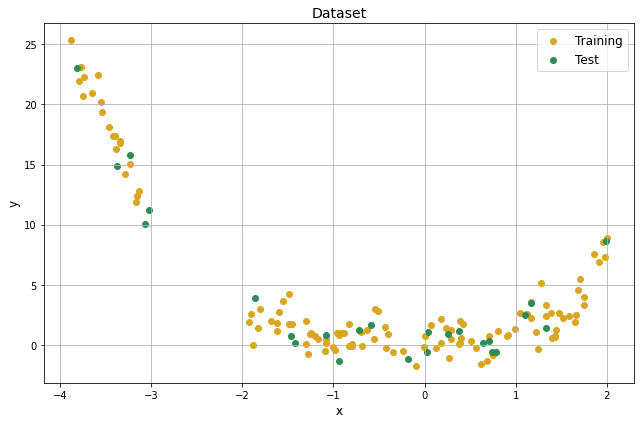

In [7]:

train_data = np.loadtxt("/content/training_set.txt", delimiter=",")
print("Shape of the training dataset:", train_data.shape)
x_train_tot, y_train_tot = get_XY(train_data)

test_data = np.loadtxt("/content/test_set.txt", delimiter=",")
print("Shape of the training dataset:", test_data.shape)
x_test, y_test = get_XY(test_data)

fig, ax = plt.subplots(1,1, figsize=(9,6))
ax.scatter(x_train_tot, y_train_tot, color="goldenrod", label="Training")
ax.scatter(x_test, y_test, color="seagreen", label="Test")
ax.set_xlabel("x", fontsize=12)
ax.set_ylabel("y", fontsize=12)
ax.set_title("Dataset", fontsize=14)
ax.legend(fontsize=12)
ax.grid()
fig.tight_layout()
plt.show()

In [8]:
Ni = 1
Nh1 = 50
Nh2 = 50
No = 1
function = "sig"

batchsize = 1
n_epochs = 5000
lr = 0.01
decay = True
lr_final = 0.001
reg_type = "None" #we will see this feature later
alpha_reg = 0.

n_folds = 4

Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 0 - Final train loss: 1.15144 - Final validation loss: 0.94566


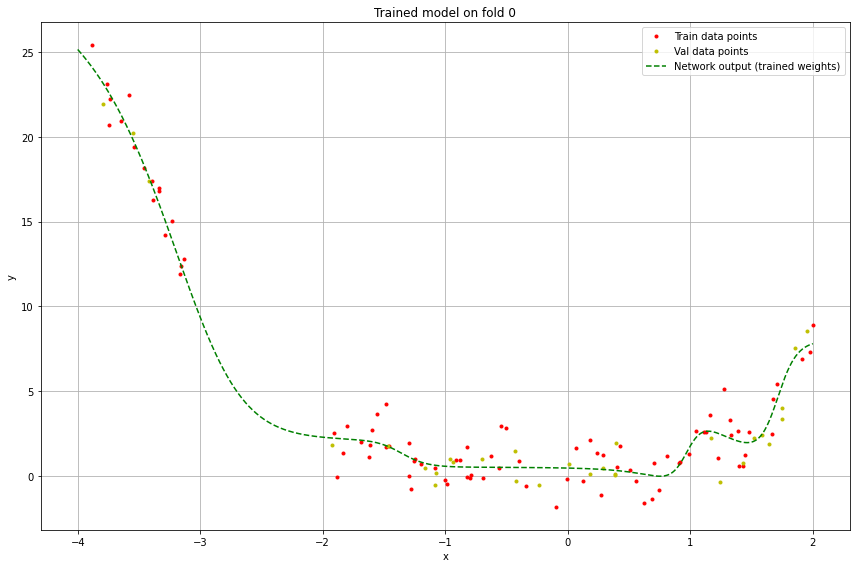

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 1 - Final train loss: 1.23680 - Final validation loss: 1.46289


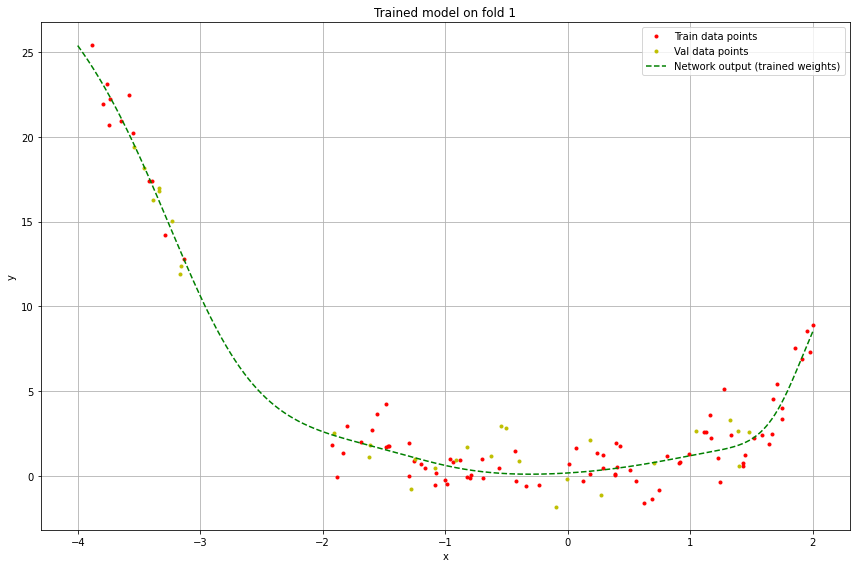

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 2 - Final train loss: 1.23803 - Final validation loss: 1.37581


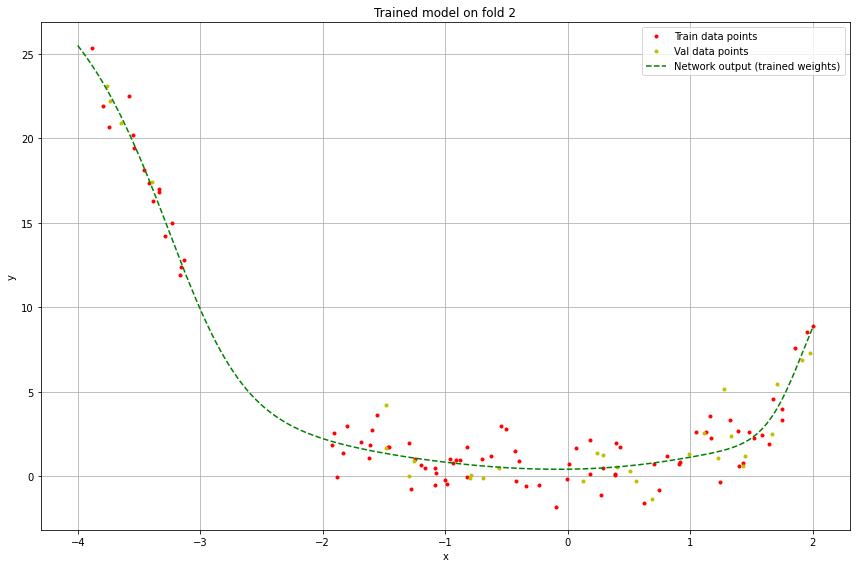

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 3 - Final train loss: 1.16814 - Final validation loss: 1.63269


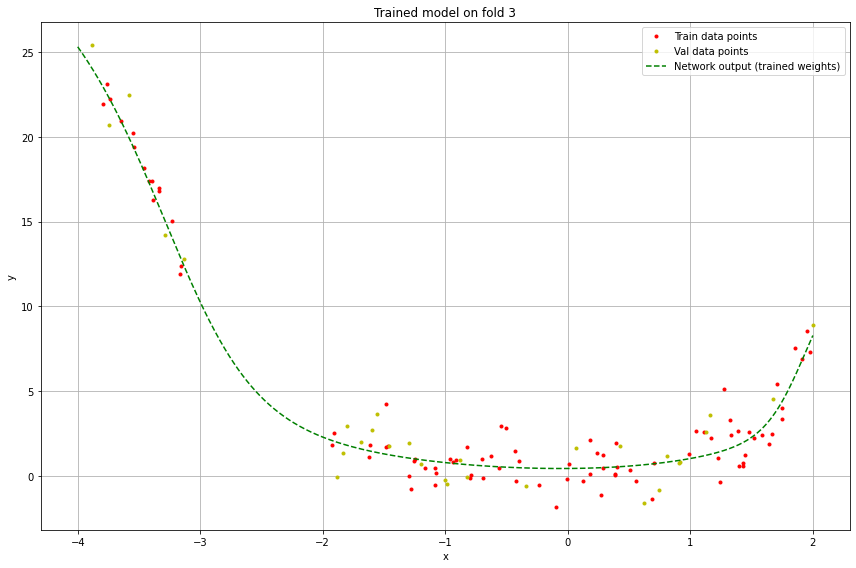

In [9]:
#these are for plotting purposes
mean_train=[]
mean_val=[]


#Preparing folds
folds = kfold(train_data, n_folds, True)

for i in tnrange(n_folds, desc="Folds loop", leave=True):
    
    ##Prepare folds: one fold is used as validation, the rest as traning set
    val_set = train_data[list(folds[i])]
    train_set = np.delete(train_data, folds[i],0)

    ###Initialize network @ each itearation over folds so train starts all over again
    net = Network(Ni, Nh1, Nh2, No, act_f=function)
    
    ###-----------TRAINING-----------###
    train_loss_log = []
    val_loss_log = []

    ###compute dacay given final value and number of epochs
    lr_decay = (lr_final / lr)**(1 / n_epochs) 

    ###set regularization function to none
    reg_term = reg(reg_type, alpha_reg)

    for num_ep in tnrange(n_epochs, desc="Epochs", leave=False):
        # Learning rate decay
        if decay:
               lr *= lr_decay

        ### create batches given batchsize: batches is a list of lists, each one has x and y 
        batches = divide_in_batches(train_set, batchsize) 

        ### train each batch
        train_loss_vec = [net.update(x, y, lr, reg_term) for x, y in batches] 
        ### compute train loss as mean over batch losses 
        #(loss of a single batch is the mean of the losses of that batch )
        train_loss = np.mean(np.array(train_loss_vec))

        ### compute validation loss
        x_val, y_val = get_XY(val_set)
        y_val_est = net.forward(x_val)
        val_loss = np.mean((y_val_est - y_val)**2)
        
        ### Update logs
        train_loss_log.append(train_loss)
        val_loss_log.append(val_loss)
    
    print('Iteration on k fold: %d - Final train loss: %.5f - Final validation loss: %.5f' 
          % (i, train_loss, val_loss))
    
    mean_train.append(train_loss_log)
    mean_val.append(val_loss_log)

    
    ##-----------This could be removed----------------##
    ##These plots show the end of the training and the comparison with actual data 
    x_highres = np.linspace(-4, 2, 1000).reshape(-1,1)
    net_output = net.forward(x_highres)

    ## Plot
    #plt.close('all')
    x_train, y_train = get_XY(train_set)
    x_val, y_val = get_XY(val_set)
    plt.figure(figsize=(12,8))
    plt.plot(x_train, y_train, color='r', ls='', marker='.', label='Train data points')
    plt.plot(x_val, y_val, color='y', ls='', marker='.', label='Val data points')
    plt.plot(x_highres, net_output, color='g', ls='--', label='Network output (trained weights)')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title("Trained model on fold "+ str(i))
    plt.grid()
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    ##-----------------------------------------------##


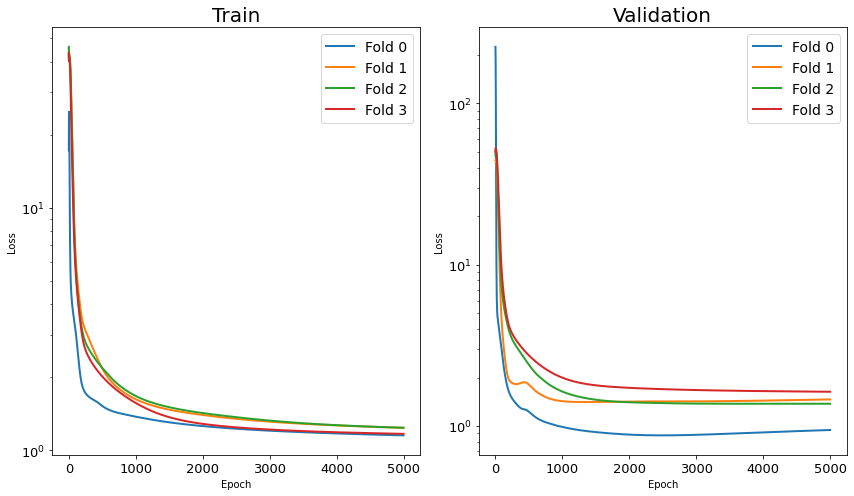

In [16]:
##Plot loss between folds
fig, ax = plt.subplots(1,2, figsize=(12,7))
for i in range(n_folds):
    ax[0].semilogy(mean_train[i], label="Fold "+str(i), linewidth=2)
    ax[1].semilogy(mean_val[i], label="Fold "+str(i), linewidth=2)
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[0].set_title("Train", fontsize=20)
ax[1].set_title("Validation", fontsize=20)
ax[0].tick_params(axis='both', which='major', labelsize=13) 
ax[1].tick_params(axis='both', which='major', labelsize=13) 
ax[0].legend(fontsize=14)
ax[1].legend(fontsize=14)
fig.tight_layout()
fig.show() 

In [17]:
patience = 250
stopped_list=[]

#these are for plotting purposes
mean_train=[]
mean_val=[]


#Preparing folds
folds = kfold(train_data, n_folds, True)

for i in tnrange(n_folds, desc="Folds loop", leave=True):
    
    ##Prepare folds: one fold is used as validation, the rest as traning set
    val_set = train_data[list(folds[i])]
    train_set = np.delete(train_data, folds[i],0)

    ###Initialize network @ each itearation over folds so train starts all over again
    net = Network(Ni, Nh1, Nh2, No, act_f=function)
    
    ###-----------TRAINING-----------###
    train_loss_log = []
    val_loss_log = []
    
    #early stopping
    best_val_loss = 1000
    stopped = n_epochs-1
    flag = True

    ###compute dacay given final value and number of epochs
    lr_decay = (lr_final / lr)**(1 / n_epochs) 

    ###set regularization function to none
    reg_term = reg(reg_type, alpha_reg)

    for num_ep in tnrange(n_epochs, desc="Epochs", leave=False):
        # Learning rate decay
        if decay:
            lr *= lr_decay

        ### create batches given batchsize: batches is a list of lists, each one has x and y 
        batches = divide_in_batches(train_set, batchsize) 

        ### train each batch
        train_loss_vec = [net.update(x, y, lr, reg_term) for x, y in batches] 
        ### compute train loss as mean over batch losses 
        #(loss of a single batch is the mean of the losses of that batch )
        train_loss = np.mean(np.array(train_loss_vec))

        ### compute validation loss
        x_val, y_val = get_XY(val_set)
        y_val_est = net.forward(x_val)
        val_loss = np.mean((y_val_est - y_val)**2)
        
        ### Update logs
        train_loss_log.append(train_loss)
        val_loss_log.append(val_loss)
        
        #early stopping: in this case the best parameters are retained but the training keeps going on
        #for plotting purpose. The code actually used during training is the pseudocode above.
        if (val_loss <= best_val_loss) and (flag == True):
            best_val_loss = val_loss
            best_train_loss = train_loss
            best_model = net
            count = 0 #count is reset everytime i get a better performance
        elif val_loss > best_val_loss:
            count += 1
        if (count >= patience) and (flag == True):
            #break
            flag = False
            stopped = num_ep
        
        
    print('Iteration on k fold: %d - Stopped at iteration: %d - Final train loss: %.4f - Final validation loss: %.4f' 
          % (i, stopped+1, train_loss, val_loss))
    print('Iteration on k fold: %d - Best validation loss: %.4f' %(i,best_val_loss))
    
    mean_train.append(train_loss_log)
    mean_val.append(val_loss_log)
    stopped_list.append(stopped)

    

Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 0 - Stopped at iteration: 5000 - Final train loss: 1.4667 - Final validation loss: 1.0738
Iteration on k fold: 0 - Best validation loss: 1.0738


Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 1 - Stopped at iteration: 2542 - Final train loss: 1.2459 - Final validation loss: 1.6943
Iteration on k fold: 1 - Best validation loss: 1.6191


Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 2 - Stopped at iteration: 607 - Final train loss: 1.1756 - Final validation loss: 1.8198
Iteration on k fold: 2 - Best validation loss: 1.1990


Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Iteration on k fold: 3 - Stopped at iteration: 5000 - Final train loss: 1.2699 - Final validation loss: 1.5275
Iteration on k fold: 3 - Best validation loss: 1.5275


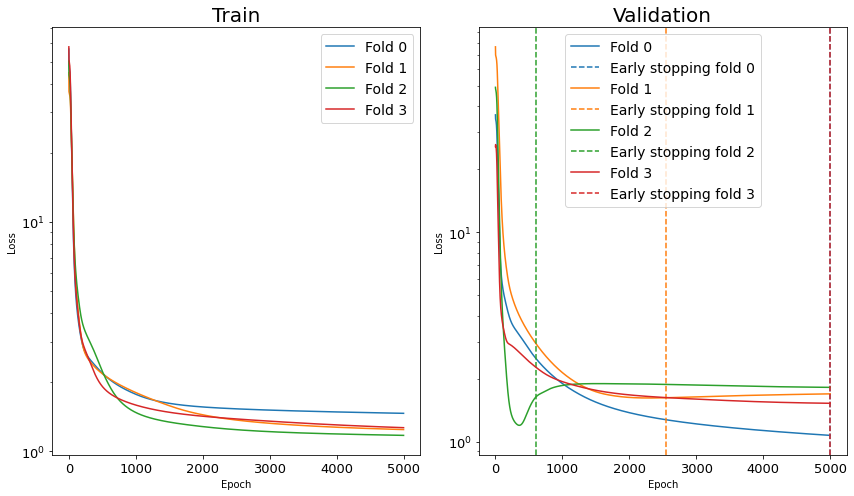

In [18]:
##Plot loss between folds
fig, ax = plt.subplots(1,2, figsize=(12,7))
for i in range(n_folds):
    ax[0].semilogy(mean_train[i], label="Fold "+str(i))
    ax[1].semilogy(mean_val[i], label="Fold "+str(i))
    ax[1].axvline(stopped_list[i]+1, color=plt.gca().lines[-1].get_color(), 
                  label="Early stopping fold "+str(i), linestyle= "--")
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[0].set_title("Train", fontsize=20)
ax[1].set_title("Validation", fontsize=20)
ax[0].tick_params(axis='both', which='major', labelsize=13) 
ax[1].tick_params(axis='both', which='major', labelsize=13) 
ax[0].legend(fontsize=14)
ax[1].legend(fontsize=14)
fig.tight_layout()
fig.show()    

In [ ]:
#Preparing file to store models and their performances
filename = "Models.csv"

parameters=["Ni","Nh1", "Nh2", "No", "act_f","n_epochs","batchsize", "lr","decay",
            "lr_final", "reg_type", "alpha_reg","patience","train_loss","val_loss"]

list_of_models = pd.DataFrame(columns=parameters)
list_of_models.to_csv(filename,index=False)

n_models = 500

with open(filename,'a',newline='') as f:
    writer=csv.writer(f)
    
    #--------FIXED PARAMETERS-------#
    Ni=1
    No=1
    n_folds = 4
    n_epochs = 500 #original is 5000
    batchsize = 1
    decay = True 
    lr_final = 0.0005
    patience = 200 #original 400
    
    #PREPARE FOLDS
    folds = kfold(train_data, n_folds, True)
    
    start = time.time()
    
    for nm in tnrange(n_models, desc="Loop over models", leave=True):
        
        ##-----PREPARING HYPERPARAMETERS-----#
        #Network
        Nh1 = np.random.randint(5,100+1)
        Nh2 = Nh1
        function = np.random.choice(["ReLU", "sig", "leaky ReLU"])
        
        #Training
        lr = np.random.random()*(0.01 - 0.001) + 0.001 
        regularizer=np.random.choice(["L1", "L2", "None"])
        alpha_reg= np.random.random()*(0.01 - 0.001) + 0.001


        Network_pars = {"Ni":Ni, "Nh1":Nh1, "Nh2":Nh2, "No":No, "act_f":function}
        Training_pars = {"n_epochs": n_epochs, "batchsize":batchsize, "lr":lr, 
                         "decay":decay, "lr_final":lr_final, "reg_type":regularizer, "alpha_reg":alpha_reg,
                         "patience":patience}

        ##These lists will contain the errors over the folds (error of the model will be the mean)
        val_err_list=[]
        train_err_list=[]

        ##Train model over folds
        for i in tnrange(n_folds, desc="Folds loop", leave=False):

            ##Prepare folds 2 
            val_set = train_data[list(folds[i])]
            train_set = np.delete(train_data, folds[i],0)

            ##Initialize network @ each itearation over folds so train starts all over again
            net = Network(**Network_pars)

            ##Training
            fit_net, train_err, val_err = train_model(net, train_set, val_set, **Training_pars, return_log=False)
            val_err_list.append(val_err)
            train_err_list.append(train_err)

        mean_val_err = np.mean(np.array(val_err_list))
        mean_train_err = np.mean(np.array(train_err_list))
        
        print("Model: %d - Training error: %.4f - Validation error: %.4f" %(nm, mean_train_err, mean_val_err))

        ##Create dictionary with model parameters and losses (train and val) and write it in a csv
        model_dict={**Network_pars,**Training_pars, "train_loss":mean_train_err, "val_loss":mean_val_err}
        writer.writerow(list(model_dict.values()))
    

    
f.close()  

end = time.time()
print("Elapsed time to train %d models: %f s" %(n_models, end-start))

Loop over models:   0%|          | 0/500 [00:00<?, ?it/s]

Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 0 - Training error: 1.6814 - Validation error: 1.8508


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 1 - Training error: 1.8606 - Validation error: 1.9603


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 2 - Training error: 1.4489 - Validation error: 1.3886


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 3 - Training error: 1.9527 - Validation error: 2.2119


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 4 - Training error: 3.7122 - Validation error: 3.7304


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 5 - Training error: 1.4746 - Validation error: 1.5115


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 6 - Training error: 1.5289 - Validation error: 1.6499


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 7 - Training error: 1.2630 - Validation error: 1.3206


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 8 - Training error: 1.8502 - Validation error: 2.0469


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 9 - Training error: 2.7863 - Validation error: 3.5441


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 10 - Training error: 1.2948 - Validation error: 1.3042


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 11 - Training error: 1.4483 - Validation error: 1.5598


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 12 - Training error: 1.4007 - Validation error: 1.4438


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 13 - Training error: 3.7472 - Validation error: 3.7198


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 14 - Training error: 1.2496 - Validation error: 1.3063


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 15 - Training error: 1.4173 - Validation error: 1.5223


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 16 - Training error: 1.2550 - Validation error: 1.3973


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 17 - Training error: 1.2910 - Validation error: 1.3611


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 18 - Training error: 1.3012 - Validation error: 1.3985


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 19 - Training error: 1.3943 - Validation error: 1.4769


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 20 - Training error: 1.4007 - Validation error: 1.4888


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 21 - Training error: 1.4415 - Validation error: 1.4113


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 22 - Training error: 1.5935 - Validation error: 1.7430


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 23 - Training error: 1.3571 - Validation error: 1.4124


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 24 - Training error: 1.2795 - Validation error: 1.4129


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 25 - Training error: 1.2120 - Validation error: 1.4166


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 26 - Training error: 1.2525 - Validation error: 1.3181


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 27 - Training error: 1.3514 - Validation error: 1.4789


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 28 - Training error: 1.3872 - Validation error: 1.4662


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 29 - Training error: 1.2381 - Validation error: 1.3048


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 30 - Training error: 2.9405 - Validation error: 3.2294


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 31 - Training error: 1.4741 - Validation error: 1.4510


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 32 - Training error: 2.5450 - Validation error: 2.0316


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 33 - Training error: 1.4213 - Validation error: 1.4585


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 34 - Training error: 1.2878 - Validation error: 1.3438


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 35 - Training error: 1.2732 - Validation error: 1.3369


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 36 - Training error: 6.2969 - Validation error: 4.2711


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 37 - Training error: 1.2887 - Validation error: 1.2687


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 38 - Training error: 1.3696 - Validation error: 1.4952


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 39 - Training error: 1.3641 - Validation error: 1.4503


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 40 - Training error: 3.7176 - Validation error: 3.7098


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 41 - Training error: 1.3204 - Validation error: 1.4017


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 42 - Training error: 1.2392 - Validation error: 1.3760


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 43 - Training error: 1.3754 - Validation error: 1.4672


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 44 - Training error: 2.4506 - Validation error: 2.8248


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 45 - Training error: 3.6022 - Validation error: 3.7731


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 46 - Training error: 2.4250 - Validation error: 2.8686


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 47 - Training error: 1.3268 - Validation error: 1.4323


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 48 - Training error: 3.5450 - Validation error: 3.7408


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 49 - Training error: 1.3498 - Validation error: 1.3971


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 50 - Training error: 3.2239 - Validation error: 3.4631


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 51 - Training error: 1.3287 - Validation error: 1.4381


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 52 - Training error: 1.8452 - Validation error: 2.0526


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 53 - Training error: 1.9698 - Validation error: 2.2033


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 54 - Training error: 1.2595 - Validation error: 1.3600


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 55 - Training error: 1.3303 - Validation error: 1.2984


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 56 - Training error: 1.3366 - Validation error: 1.4331


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 57 - Training error: 1.2137 - Validation error: 1.3899


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 58 - Training error: 1.6134 - Validation error: 1.7718


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 59 - Training error: 2.6128 - Validation error: 2.8561


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 60 - Training error: 8.9292 - Validation error: 2.0823


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 61 - Training error: 1.2517 - Validation error: 1.3202


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 62 - Training error: 1.4075 - Validation error: 1.4833


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 63 - Training error: 1.3167 - Validation error: 1.3679


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 64 - Training error: 1.7339 - Validation error: 1.9445


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 65 - Training error: 1.3221 - Validation error: 1.3819


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 66 - Training error: 1.3008 - Validation error: 1.3947


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 67 - Training error: 3.1216 - Validation error: 3.1840


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 68 - Training error: 1.2491 - Validation error: 1.3798


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 69 - Training error: 3.0992 - Validation error: 3.4427


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 70 - Training error: 1.3093 - Validation error: 1.3635


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 71 - Training error: 1.3524 - Validation error: 1.4313


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 72 - Training error: 3.1940 - Validation error: 1.6300


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 73 - Training error: 3.6520 - Validation error: 3.7098


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 74 - Training error: 1.9037 - Validation error: 2.2166


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 75 - Training error: 1.2907 - Validation error: 1.3322


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 76 - Training error: 1.4007 - Validation error: 1.4399


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 77 - Training error: 1.3272 - Validation error: 1.3923


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 78 - Training error: 1.6689 - Validation error: 1.8239


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 79 - Training error: 1.3344 - Validation error: 1.4334


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 80 - Training error: 1.1945 - Validation error: 1.3939


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 81 - Training error: 1.2091 - Validation error: 1.2762


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 82 - Training error: 1.3216 - Validation error: 1.3880


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 83 - Training error: 1.2946 - Validation error: 1.3636


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 84 - Training error: 1.3584 - Validation error: 1.4261


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 85 - Training error: 1.2678 - Validation error: 1.4346


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 86 - Training error: 1.7367 - Validation error: 1.9021


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 87 - Training error: 1.3872 - Validation error: 1.4473


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 88 - Training error: 2.9213 - Validation error: 3.5096


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 89 - Training error: 1.5381 - Validation error: 1.6608


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 90 - Training error: 1.5591 - Validation error: 1.6924


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 91 - Training error: 2.0905 - Validation error: 2.3511


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 92 - Training error: 2.3381 - Validation error: 2.6486


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 93 - Training error: 1.3246 - Validation error: 1.3232


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 94 - Training error: 1.3883 - Validation error: 1.4333


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 95 - Training error: 2.0350 - Validation error: 2.3236


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 96 - Training error: 1.5153 - Validation error: 1.5159


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 97 - Training error: 1.2749 - Validation error: 1.3097


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 98 - Training error: 1.3794 - Validation error: 1.4320


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 99 - Training error: 1.4963 - Validation error: 1.6007


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 100 - Training error: 1.4220 - Validation error: 1.4921


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 101 - Training error: 1.4018 - Validation error: 1.4612


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 102 - Training error: 1.3755 - Validation error: 1.4469


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 103 - Training error: 1.2961 - Validation error: 1.2841


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 104 - Training error: 1.3133 - Validation error: 1.3883


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 105 - Training error: 2.5786 - Validation error: 1.5606


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 106 - Training error: 1.2729 - Validation error: 1.3850


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 107 - Training error: 2.0769 - Validation error: 2.3488


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 108 - Training error: 1.3662 - Validation error: 1.3963


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 109 - Training error: 3.6192 - Validation error: 3.7306


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 110 - Training error: 1.2806 - Validation error: 1.3542


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 111 - Training error: 1.2831 - Validation error: 1.3745


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 112 - Training error: 1.3701 - Validation error: 1.4244


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 113 - Training error: 1.4505 - Validation error: 1.5705


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 114 - Training error: 1.3169 - Validation error: 1.3476


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 115 - Training error: 1.2883 - Validation error: 1.2886


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 116 - Training error: 1.3183 - Validation error: 1.3159


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 117 - Training error: 1.7303 - Validation error: 1.9054


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 118 - Training error: 1.2832 - Validation error: 1.4314


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 119 - Training error: 3.0365 - Validation error: 3.5915


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 120 - Training error: 1.5537 - Validation error: 1.6965


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 121 - Training error: 1.4222 - Validation error: 1.5172


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 122 - Training error: 1.8037 - Validation error: 1.9676


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 123 - Training error: 3.0127 - Validation error: 3.3103


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 124 - Training error: 1.2191 - Validation error: 1.5182


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 125 - Training error: 1.4397 - Validation error: 1.5395


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 126 - Training error: 1.2703 - Validation error: 1.3335


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 127 - Training error: 1.2462 - Validation error: 1.3336


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 128 - Training error: 1.2432 - Validation error: 1.2948


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 129 - Training error: 1.3630 - Validation error: 1.4428


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 130 - Training error: 1.4202 - Validation error: 1.5233


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 131 - Training error: 4.5325 - Validation error: 3.6276


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 132 - Training error: 1.9091 - Validation error: 2.1248


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 133 - Training error: 1.3795 - Validation error: 1.4029


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 134 - Training error: 1.2552 - Validation error: 1.4136


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 135 - Training error: 1.9916 - Validation error: 2.4325


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 136 - Training error: 1.4301 - Validation error: 1.5195


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 137 - Training error: 1.4936 - Validation error: 1.6022


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 138 - Training error: 1.3627 - Validation error: 1.4117


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 139 - Training error: 1.2874 - Validation error: 1.4167


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 140 - Training error: 1.4381 - Validation error: 1.5312


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 141 - Training error: 1.2077 - Validation error: 1.2962


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 142 - Training error: 1.2841 - Validation error: 1.3235


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 143 - Training error: 1.2559 - Validation error: 1.3360


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 144 - Training error: 1.3026 - Validation error: 1.3813


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 145 - Training error: 1.8694 - Validation error: 2.0559


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 146 - Training error: 3.5926 - Validation error: 3.7139


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 147 - Training error: 1.3803 - Validation error: 1.4731


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 148 - Training error: 1.8237 - Validation error: 2.0102


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 149 - Training error: 1.3533 - Validation error: 1.4156


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 150 - Training error: 1.3514 - Validation error: 1.4171


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 151 - Training error: 1.2861 - Validation error: 1.4485


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 152 - Training error: 1.3563 - Validation error: 1.5050


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 153 - Training error: 2.0657 - Validation error: 2.3059


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 154 - Training error: 1.3870 - Validation error: 1.4682


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 155 - Training error: 1.2398 - Validation error: 1.3563


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 156 - Training error: 1.5272 - Validation error: 1.6420


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 157 - Training error: 1.4705 - Validation error: 1.5966


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 158 - Training error: 3.1983 - Validation error: 3.5799


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 159 - Training error: 1.2626 - Validation error: 1.3285


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 160 - Training error: 1.8572 - Validation error: 2.0783


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 161 - Training error: 1.3396 - Validation error: 1.3207


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 162 - Training error: 1.1763 - Validation error: 1.2617


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 163 - Training error: 8.1834 - Validation error: 2.3679


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 164 - Training error: 1.4231 - Validation error: 1.5107


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 165 - Training error: 1.3674 - Validation error: 1.4370


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 166 - Training error: 1.7791 - Validation error: 1.3877


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 167 - Training error: 1.9354 - Validation error: 1.3085


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 168 - Training error: 1.3351 - Validation error: 1.4235


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 169 - Training error: 3.6707 - Validation error: 3.7270


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 170 - Training error: 1.3828 - Validation error: 1.4414


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 171 - Training error: 3.0167 - Validation error: 3.3284


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 172 - Training error: 3.6488 - Validation error: 3.7048


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 173 - Training error: 1.3416 - Validation error: 1.3243


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 174 - Training error: 1.3507 - Validation error: 1.3727


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 175 - Training error: 2.2525 - Validation error: 1.8939


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 176 - Training error: 1.9004 - Validation error: 2.1423


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 177 - Training error: 1.8441 - Validation error: 2.0450


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 178 - Training error: 2.4586 - Validation error: 2.8961


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 179 - Training error: 2.1969 - Validation error: 2.5494


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 180 - Training error: 1.2953 - Validation error: 1.3552


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 181 - Training error: 1.3465 - Validation error: 1.4039


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 182 - Training error: 1.9136 - Validation error: 2.1343


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 183 - Training error: 1.3055 - Validation error: 1.3618


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 184 - Training error: 1.4777 - Validation error: 1.3513


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 185 - Training error: 1.4108 - Validation error: 1.4450


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 186 - Training error: 1.3671 - Validation error: 1.4196


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 187 - Training error: 1.3903 - Validation error: 1.4586


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 188 - Training error: 1.3650 - Validation error: 1.3749


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 189 - Training error: 1.2759 - Validation error: 1.3447


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 190 - Training error: 2.2100 - Validation error: 2.5104


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 191 - Training error: 3.0685 - Validation error: 3.3927


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 192 - Training error: 3.7301 - Validation error: 3.7160


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 193 - Training error: 1.9159 - Validation error: 2.1999


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 194 - Training error: 1.8194 - Validation error: 2.0326


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 195 - Training error: 3.7037 - Validation error: 3.6976


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 196 - Training error: 1.3300 - Validation error: 1.4277


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 197 - Training error: 2.0527 - Validation error: 2.3384


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 198 - Training error: 1.8916 - Validation error: 2.1025


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 199 - Training error: 1.4255 - Validation error: 1.5069


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 200 - Training error: 1.4357 - Validation error: 1.5253


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 201 - Training error: 2.1719 - Validation error: 2.3426


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 202 - Training error: 2.6114 - Validation error: 1.6520


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 203 - Training error: 1.5887 - Validation error: 1.7228


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 204 - Training error: 1.4133 - Validation error: 1.4097


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Model: 205 - Training error: 1.3311 - Validation error: 1.3803


Folds loop:   0%|          | 0/4 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
filename = "/content/Models.csv"

In [12]:
models = pd.read_csv(filename, sep=",")
best_set = models.iloc[[models.val_loss.argmin()]]
print("Set of best performing hyperparameters:")
print(best_set)

#save best set
best_set.to_csv("best_set.csv", index=False)


#convert best model into dictionary
best_set=best_set.drop(["train_loss", "val_loss"], axis=1).to_dict("r")[0]
Network_pars = { your_key: best_set[your_key] for your_key in ["Ni","Nh1", "Nh2", "No", "act_f"]}#Network_pars.keys()}
Training_pars = { your_key: best_set[your_key] for your_key in ["n_epochs","batchsize", "lr","decay",
            "lr_final", "reg_type", "alpha_reg","patience"]}#Training_pars.keys()}

Set of best performing hyperparameters:
     Ni  Nh1  Nh2  No act_f  n_epochs  batchsize        lr  decay  lr_final  \
115   1   83   83   1  ReLU      5000          1  0.004649   True    0.0005   

    reg_type  alpha_reg  patience  train_loss  val_loss  
115       L1   0.005045       400    1.296493  1.175889  


In [13]:
models=models.sort_values(by=["val_loss"], ascending=True)
print("Models sorted by val_loss")
models[:10]

Models sorted by val_loss


,Ni,Nh1,Nh2,No,act_f,n_epochs,batchsize,lr,decay,lr_final,reg_type,alpha_reg,patience,train_loss,val_loss
115,1,83,83,1,ReLU,5000,1,0.004649,True,0.0005,L1,0.005045,400,1.296493,1.175889
407,1,18,18,1,leaky ReLU,5000,1,0.003041,True,0.0005,L1,0.004715,400,1.209309,1.180338
78,1,36,36,1,ReLU,5000,1,0.005362,True,0.0005,L1,0.004551,400,1.246092,1.185091
356,1,22,22,1,ReLU,5000,1,0.002801,True,0.0005,L1,0.009949,400,1.187830,1.187684
381,1,95,95,1,leaky ReLU,5000,1,0.004652,True,0.0005,L2,0.001209,400,1.018887,1.191083
369,1,54,54,1,leaky ReLU,5000,1,0.004975,True,0.0005,None,0.006032,400,1.010799,1.199372
3,1,36,36,1,ReLU,5000,1,0.004849,True,0.0005,None,0.003345,400,1.019511,1.202238
81,1,15,15,1,ReLU,5000,1,0.006651,True,0.0005,L1,0.003373,400,1.138848,1.202509
410,1,35,35,1,leaky ReLU,5000,1,0.008371,True,0.0005,None,0.004867,400,1.648158,1.212052
104,1,18,18,1,leaky ReLU,5000,1,0.005211,True,0.0005,None,0.007246,400,1.029250,1.215023


In [14]:
#TRAINING FINAL MODEL
#Divide train dataset in 80-20 train and validation to evaluate final model (weights)
#Validation set is used mainly for monitoring performances and performing early stopping
np.random.shuffle(train_data)
train_set = train_data[:int(np.ceil(8*len(train_data)/10))]
val_set = train_data[int(np.ceil(8*len(train_data)/10)):]

#Training final model
net = Network(**Network_pars)
final_net, train_err, val_err, train_log, val_log = train_model(net, train_set, val_set, **Training_pars, return_log=True)
#------> final_net has final weights and hyperparameters


#Saving best model weights
np.savetxt("WBh1.txt", final_net.WBh1)
np.savetxt("WBh2.txt", final_net.WBh2)
np.savetxt("WBo.txt", final_net.WBo)

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Train error on final model: 1.5846918575433309
Validation error on final model: 1.1133305323650864
Test error on final model: 1.2503349022165857


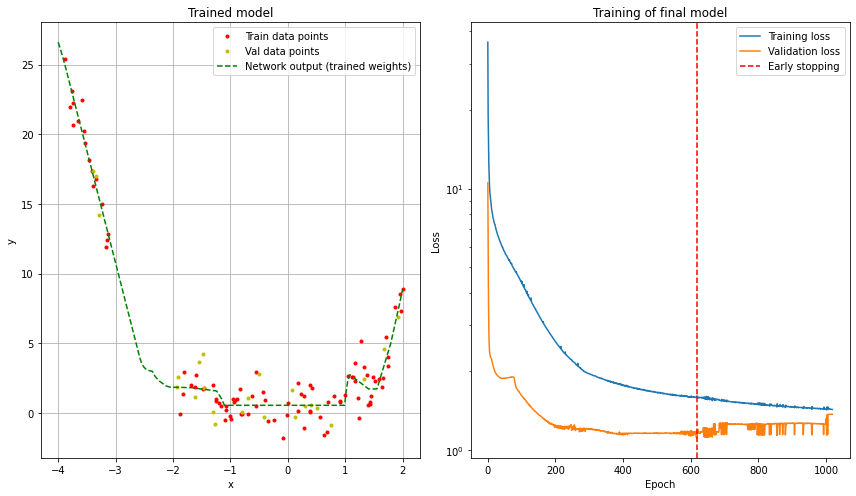

In [15]:
##Plot loss between folds
fig, ax = plt.subplots(1,2, figsize=(12,7))

x_highres = np.linspace(-4, 2, 1000).reshape(-1,1)
net_output = final_net.forward(x_highres)
x_train, y_train = get_XY(train_set)
x_val, y_val = get_XY(val_set)
ax[0].plot(x_train, y_train, color='r', ls='', marker='.', label='Train data points')
ax[0].plot(x_val, y_val, color='y', ls='', marker='.', label='Val data points')
ax[0].plot(x_highres, net_output, color='g', ls='--', label='Network output (trained weights)')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].set_title("Trained model")
ax[0].grid()
ax[0].legend()

ax[1].semilogy(train_log, label="Training loss")
ax[1].semilogy(val_log, label="Validation loss")
if len(val_log) != Training_pars["n_epochs"]:
    stopped = len(val_log)-Training_pars["patience"]
    ax[1].axvline(stopped, color="r", 
                  label="Early stopping", linestyle= "--")
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].set_title("Training of final model")
ax[1].legend()

fig.tight_layout()
fig.show()    

#EVALUATING FINAL MODEL PERFORMANCES ON TEST SET
y_test_est = final_net.forward(x_test)
test_loss = np.mean((y_test_est - y_test)**2)
print("Train error on final model:", train_err)
print("Validation error on final model:", val_err)
print("Test error on final model:", test_loss)
